In [1]:
import os

from matplotlib import pyplot as plt
import PIL

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [2]:
dir_img = 'C:\\_pfm\\img'

dir_l = dir_img + '\\train_l'
dir_s = dir_img + '\\train_s'

In [3]:
crop_size = 300
upscale_factor = 4
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    dir_l,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    seed=101,
    label_mode=None,
)

Found 200 files belonging to 1 classes.


In [4]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image

# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)

In [5]:
def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )

def plot_results(img, filename):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    ###plt.title(title)
    ###plt.yticks(visible=False)
    ###plt.xticks(visible=False)
    plt.axis('off')
    extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    plt.savefig(os.path.join(dir_s, filename),  bbox_inches = 'tight', pad_inches = 0)
    
    plt.show()

In [6]:
img_paths = sorted(
    [
        os.path.join(dir_l, fname)
        for fname in os.listdir(dir_l)
        if fname.endswith(".jpg")
    ]
)

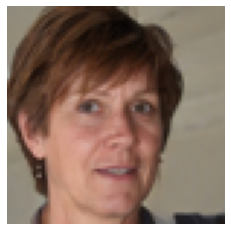

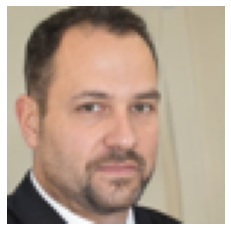

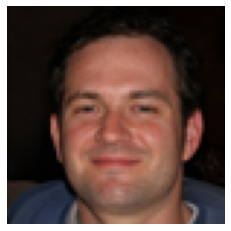

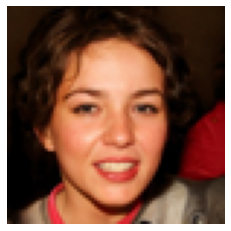

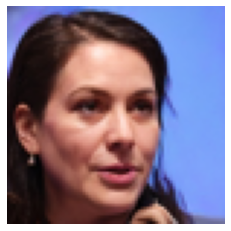

...

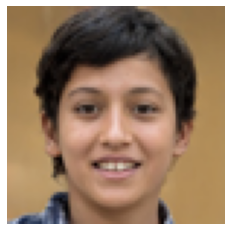

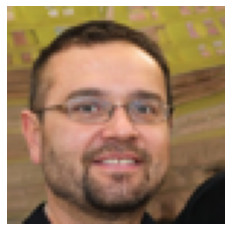

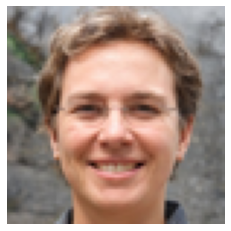

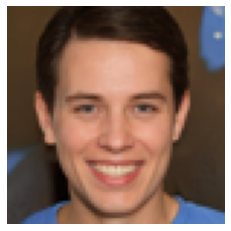

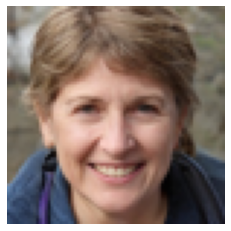

In [7]:
for index, img_path in enumerate(img_paths[:]):
    imagen = load_img(img_path)
    lowres_input = get_lowres_image(imagen, upscale_factor)
    #w = lowres_input.size[0] #* upscale_factor
    #h = lowres_input.size[1] #* upscale_factor
    tf.image.resize(lowres_input, [input_size, input_size], method="area")
    #lowres_img = lowres_input.resize((w, h))
    
    ###print(img_path)
    filename = img_path.replace(dir_l, '')
    filename = filename.replace('\\', '')
    filename = filename.replace('high', 'redu')
    ###print(filename)
    plot_results(lowres_input, filename)
    